In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import string
import re
from sklearn.preprocessing import LabelEncoder
import numpy as np

In [2]:
df=pd.read_csv("hotel_reviewssentiments.csv")
df

,ID,Country_name,Hotel_name,Rating,Site_Name,Review,Language,Sentiment
0,1,Belgium,Botanic Sanctuary Antwerp,1.0,Google Reviews,“I recently had the pleasure of staying at the...,en,Positive
1,2,Belgium,Botanic Sanctuary Antwerp,5.0,Google Reviews,Just discovered this fantastic hotel in the he...,en,Positive
2,3,Belgium,Botanic Sanctuary Antwerp,5.0,Google Reviews,Connecting a mixture of old buildings through ...,en,Positive
3,4,Belgium,Botanic Sanctuary Antwerp,4.0,Google Reviews,Great hotel in a perfect location.\nWe stayed ...,en,Positive
4,5,Belgium,Botanic Sanctuary Antwerp,1.0,Google Reviews,An Expensive Letdown\n\nLet me begin with the ...,en,Negative
...,...,...,...,...,...,...,...,...
4724,4725,England,The Standard,5.0,Tripadvisor,Visited Sweetie for a work celebration. Chris...,en,Positive
4725,4726,England,The Standard,5.0,Tripadvisor,"Derek, Zoe, Nordine, and Adian always make my ...",en,Positive
4726,4727,England,The Standard,5.0,Tripadvisor,Ate at the restaurant food was amazing and Adr...,en,Positive
4727,4728,England,The Standard,4.0,Tripadvisor,This restaurant was amazing and we were immedi...,en,Positive


In [4]:
# Dropping rows with missing 'Review' values
df = df.dropna(subset=['Review'])

# Lowercasing
df['Review'] = df['Review'].apply(lambda x: str(x).lower())

# Tokenization
nltk.download('punkt')
df['Tokenized_Review'] = df['Review'].apply(lambda x: word_tokenize(x))

# Removing Punctuation
df['Tokenized_Review'] = df['Tokenized_Review'].apply(
    lambda tokens: [word for word in tokens if word not in string.punctuation]
)

# Removing Stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
df['Tokenized_Review'] = df['Tokenized_Review'].apply(
    lambda tokens: [word for word in tokens if word not in stop_words]
)

# Stemming
stemmer = PorterStemmer()
df['Stemmed_Review'] = df['Tokenized_Review'].apply(
    lambda tokens: [stemmer.stem(word) for word in tokens]
)

# Removing Emojis and Emoticons
def remove_emoji(text):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

df['Review_No_Emoji'] = df['Review'].apply(lambda x: remove_emoji(x))

# Handling Numerical Values (optional)
df['Review_No_Numbers'] = df['Review_No_Emoji'].apply(lambda x: re.sub(r'\d+', '', x))

# Handling Special Characters (optional)
df['Review_No_Special_Chars'] = df['Review_No_Numbers'].apply(lambda x: re.sub(r'[^A-Za-z0-9\s]+', '', x))

C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\3091589634.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Review'] = df['Review'].apply(lambda x: str(x).lower())
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\3091589634.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Tokenized_Review'] = df['Review'].apply(lambda x: word_tokenize(x))
C:\User

In [5]:
df

,ID,Country_name,Hotel_name,Rating,Site_Name,Review,Language,Sentiment,Tokenized_Review,Stemmed_Review,Review_No_Emoji,Review_No_Numbers,Review_No_Special_Chars
0,1,Belgium,Botanic Sanctuary Antwerp,1.0,Google Reviews,“i recently had the pleasure of staying at the...,en,Positive,"[“, recently, pleasure, staying, botanic, hote...","[“, recent, pleasur, stay, botan, hotel, antwe...",“i recently had the pleasure of staying at the...,“i recently had the pleasure of staying at the...,i recently had the pleasure of staying at the ...
1,2,Belgium,Botanic Sanctuary Antwerp,5.0,Google Reviews,just discovered this fantastic hotel in the he...,en,Positive,"[discovered, fantastic, hotel, heart, antwerp,...","[discov, fantast, hotel, heart, antwerp, highl...",just discovered this fantastic hotel in the he...,just discovered this fantastic hotel in the he...,just discovered this fantastic hotel in the he...
2,3,Belgium,Botanic Sanctuary Antwerp,5.0,Google Reviews,connecting a mixture of old buildings through ...,en,Positive,"[connecting, mixture, old, buildings, greenhou...","[connect, mixtur, old, build, greenhouse-lik, ...",connecting a mixture of old buildings through ...,connecting a mixture of old buildings through ...,connecting a mixture of old buildings through ...
3,4,Belgium,Botanic Sanctuary Antwerp,4.0,Google Reviews,great hotel in a perfect location.\nwe stayed ...,en,Positive,"[great, hotel, perfect, location, stayed, bota...","[great, hotel, perfect, locat, stay, botan, ho...",great hotel in a perfect location.\nwe stayed ...,great hotel in a perfect location.\nwe stayed ...,great hotel in a perfect location\nwe stayed i...
4,5,Belgium,Botanic Sanctuary Antwerp,1.0,Google Reviews,an expensive letdown\n\nlet me begin with the ...,en,Negative,"[expensive, letdown, let, begin, highlight, bo...","[expens, letdown, let, begin, highlight, botan...",an expensive letdown\n\nlet me begin with the ...,an expensive letdown\n\nlet me begin with the ...,an expensive letdown\n\nlet me begin with the ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4724,4725,England,The Standard,5.0,Tripadvisor,visited sweetie for a work celebration. chris...,en,Positive,"[visited, sweetie, work, celebration, chris, l...","[visit, sweeti, work, celebr, chri, look, crew...",visited sweetie for a work celebration. chris...,visited sweetie for a work celebration. chris...,visited sweetie for a work celebration chris ...
4725,4726,England,The Standard,5.0,Tripadvisor,"derek, zoe, nordine, and adian always make my ...",en,Positive,"[derek, zoe, nordine, adian, always, make, tim...","[derek, zoe, nordin, adian, alway, make, time,...","derek, zoe, nordine, and adian always make my ...","derek, zoe, nordine, and adian always make my ...",derek zoe nordine and adian always make my tim...
4726,4727,England,The Standard,5.0,Tripadvisor,ate at the restaurant food was amazing and adr...,en,Positive,"[ate, restaurant, food, amazing, adrian, gave,...","[ate, restaur, food, amaz, adrian, gave, us, a...",ate at the restaurant food was amazing and adr...,ate at the restaurant food was amazing and adr...,ate at the restaurant food was amazing and adr...
4727,4728,England,The Standard,4.0,Tripadvisor,this restaurant was amazing and we were immedi...,en,Positive,"[restaurant, amazing, immediately, shown, tabl...","[restaur, amaz, immedi, shown, tabl, given, me...",this restaurant was amazing and we were immedi...,this restaurant was amazing and we were immedi...,this restaurant was amazing and we were immedi...


In [9]:
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

In [7]:
# TF-IDF vectorization
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(df['Review_No_Special_Chars'])  # Assuming Review_No_Special_Chars contains preprocessed text
y = df['Sentiment']

In [10]:
# Splitting the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [17]:
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Decision Trees': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(),
    'k-NN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB()
}

for clf_name, clf in classifiers.items():
    clf.fit(X_train.toarray(), y_train)
    y_pred = clf.predict(X_test.toarray())
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Evaluating {clf_name}...')
    print(f'Accuracy: {accuracy:.2f}')
    print('Classification Report:')
    print(classification_report(y_test, y_pred))
    print('\n')

Evaluating Logistic Regression...
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

    Negative       1.00      0.02      0.04        48
     Neutral       0.74      0.56      0.64        77
    Positive       0.91      0.99      0.95       821

    accuracy                           0.90       946
   macro avg       0.88      0.52      0.54       946
weighted avg       0.90      0.90      0.88       946



Evaluating Decision Trees...
Accuracy: 0.91
Classification Report:
              precision    recall  f1-score   support

    Negative       0.34      0.29      0.31        48
     Neutral       0.80      0.83      0.82        77
    Positive       0.95      0.95      0.95       821

    accuracy                           0.91       946
   macro avg       0.70      0.69      0.69       946
weighted avg       0.90      0.91      0.91       946



Evaluating Random Forest...
Accuracy: 0.91
Classification Report:
              precision    re

c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Evaluating SVM...
Accuracy: 0.90
Classification Report:
              precision    recall  f1-score   support

    Negative       0.00      0.00      0.00        48
     Neutral       0.76      0.51      0.61        77
    Positive       0.91      0.99      0.94       821

    accuracy                           0.90       946
   macro avg       0.56      0.50      0.52       946
weighted avg       0.85      0.90      0.87       946





c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Evaluating k-NN...
Accuracy: 0.08
Classification Report:
              precision    recall  f1-score   support

    Negative       0.00      0.00      0.00        48
     Neutral       0.08      1.00      0.15        77
    Positive       0.00      0.00      0.00       821

    accuracy                           0.08       946
   macro avg       0.03      0.33      0.05       946
weighted avg       0.01      0.08      0.01       946





c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\DELL\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Evaluating Naive Bayes...
Accuracy: 0.88
Classification Report:
              precision    recall  f1-score   support

    Negative       0.10      0.08      0.09        48
     Neutral       0.81      0.49      0.61        77
    Positive       0.92      0.96      0.94       821

    accuracy                           0.88       946
   macro avg       0.61      0.51      0.55       946
weighted avg       0.87      0.88      0.87       946





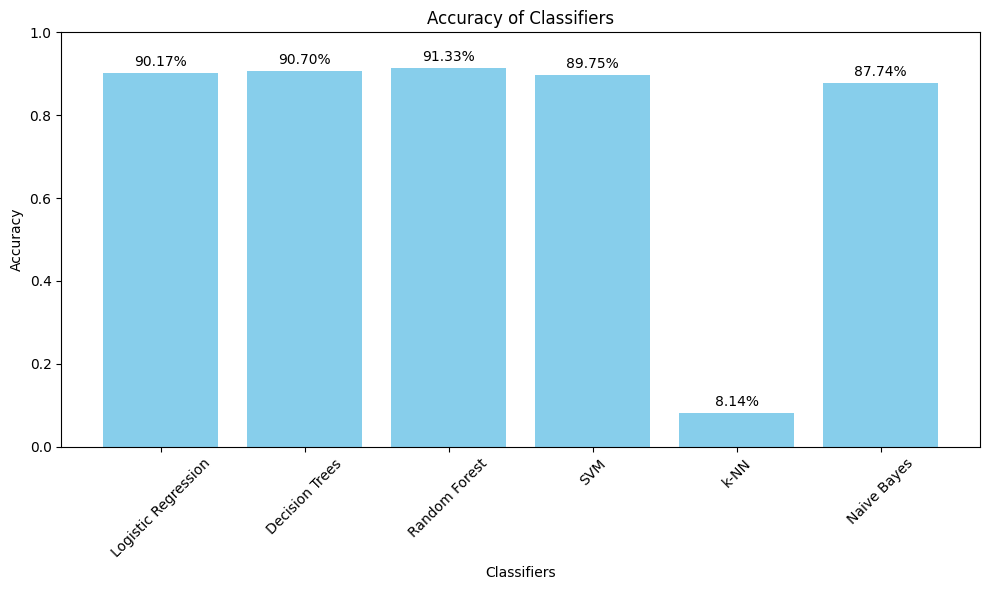

In [15]:
import matplotlib.pyplot as plt

# Accuracy scores for each classifier
accuracies = {
    'Logistic Regression': 0.9016913319238901,
    'Decision Trees': 0.9069767441860465,
    'Random Forest': 0.9133192389006343,
    'SVM': 0.8974630021141649,
    'k-NN': 0.08139534883720931,
    'Naive Bayes': 0.8773784355179705
}

# Plotting the accuracy scores
plt.figure(figsize=(10, 6))
bars = plt.bar(accuracies.keys(), accuracies.values(), color='skyblue')

# Displaying accuracy percentages on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.01, f'{yval:.2%}', ha='center', va='bottom')

plt.xlabel('Classifiers')
plt.ylabel('Accuracy')
plt.title('Accuracy of Classifiers')
plt.ylim(0, 1.0)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

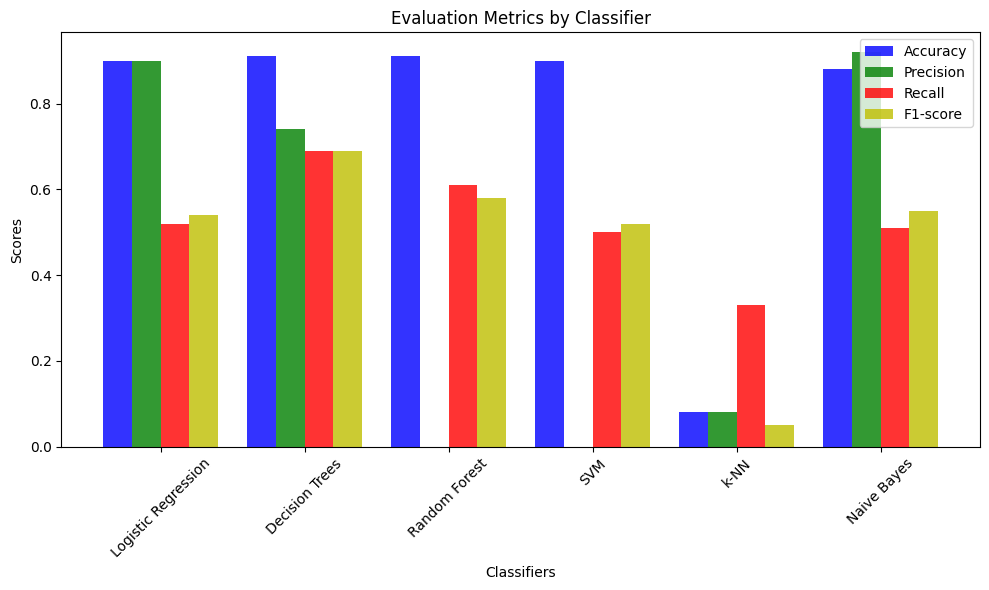

In [20]:
import matplotlib.pyplot as plt

# Define accuracy values for each classifier
accuracies = [0.90, 0.91, 0.91, 0.90, 0.08, 0.88]

# Define precision, recall, and F1-score values for each classifier
precisions = [0.90, 0.74, 0.00, 0.00, 0.08, 0.92]
recalls = [0.52, 0.69, 0.61, 0.50, 0.33, 0.51]
f1_scores = [0.54, 0.69, 0.58, 0.52, 0.05, 0.55]

# Classifier names
classifiers = [
    'Logistic Regression',
    'Decision Trees',
    'Random Forest',
    'SVM',
    'k-NN',
    'Naive Bayes'
]

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
index = range(len(classifiers))

bar_width = 0.2
opacity = 0.8

rects1 = plt.bar(index, accuracies, bar_width, alpha=opacity, color='b', label='Accuracy')
rects2 = plt.bar([i + bar_width for i in index], precisions, bar_width, alpha=opacity, color='g', label='Precision')
rects3 = plt.bar([i + bar_width * 2 for i in index], recalls, bar_width, alpha=opacity, color='r', label='Recall')
rects4 = plt.bar([i + bar_width * 3 for i in index], f1_scores, bar_width, alpha=opacity, color='y', label='F1-score')

plt.xlabel('Classifiers')
plt.ylabel('Scores')
plt.title('Evaluation Metrics by Classifier')
plt.xticks([i + bar_width * 1.5 for i in index], classifiers, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

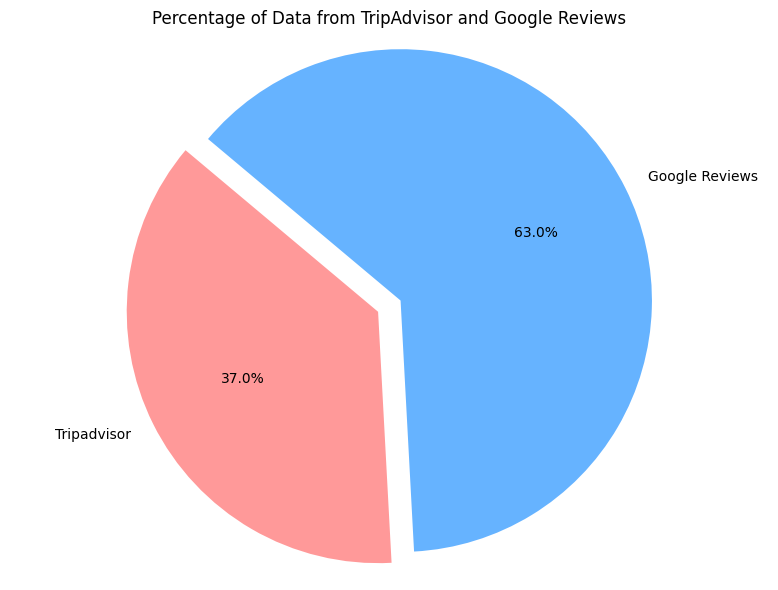

In [21]:
# Count occurrences of each review site
site_counts = df['Site_Name'].value_counts()

# Calculate percentages
total_data = len(df)
percentage_tripadvisor = (site_counts['Tripadvisor'] / total_data) * 100
percentage_google = (site_counts['Google Reviews'] / total_data) * 100

# Create a pie chart to visualize the distribution
labels = ['Tripadvisor', 'Google Reviews']
sizes = [percentage_tripadvisor, percentage_google]
colors = ['#ff9999', '#66b3ff']
explode = (0.1, 0)  # explode 1st slice

plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title('Percentage of Data from TripAdvisor and Google Reviews')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.tight_layout()
plt.show()

In [39]:
for country in df['Country_name'].unique():
    print(f"Country: {country}")
    
    # Filter the DataFrame for the current country
    country_hotels = df[df['Country_name'] == country]['Hotel_name'].unique()
    
    # Print hotel names in the current country
    for hotel in country_hotels:
        print(f"\t{hotel}")

Country: Belgium
	Botanic Sanctuary Antwerp
	Eurostars Montgomery
	Radisson Collection Grand Place Brussels
	Martin's Chateau Du Lac Hotel
	La Butte aux Bois
Country: Italy
	Grand Hotel La Favorita
	Hotel Lungarno
	San Firenze Suites & Spa
	Singer Palace Hotel
	Monastero di Cortona Hotel & Spa
Country: Portugal
	Corpo Santo Lisbon Historical Hotel
	Hotel Avenida Palace
	Hotel The Cliff Bay
	Quinta Jardins do Lago
	Vila Vita Parc Resort & Spa
Country: Germany
	Hotel Europaischer Hof Heidelberg
	Excelsior Hotel Ernst
	Grand Elysee Hotel Hamburg
	Grand Hyatt Berlin
	The Mandala Hotel
Country: France
	Grand Hotel du Palais Royal
	Hôtel Grand Powers
	Hôtel Regina Louvre
	Le Narcisse Blanc Hotel & Spa
	Le Negresco
Country: Spain
	Majestic Hotel & Spa Barcelona
	Palacio de los Duques Gran Meliá
	Paradisus by Meliá Gran Canaria
	Serras Barcelona
	The Principal Madrid
Country: Netherlands
	Collection Eindhoven Centre
	Hotel Okura Amsterdam
	Pillows Grand Boutique Hotel Maurits
	Pulitzer Amsterd

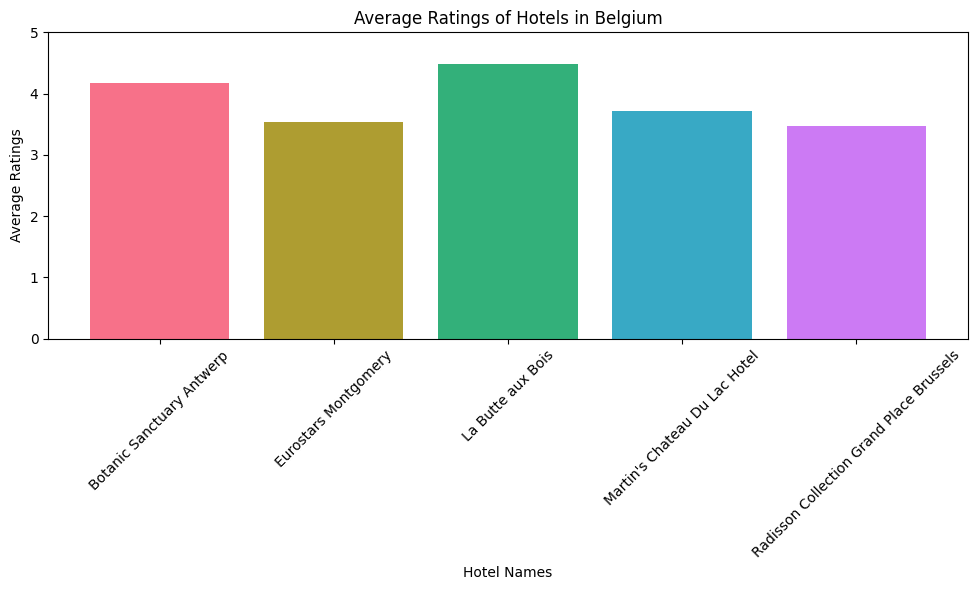

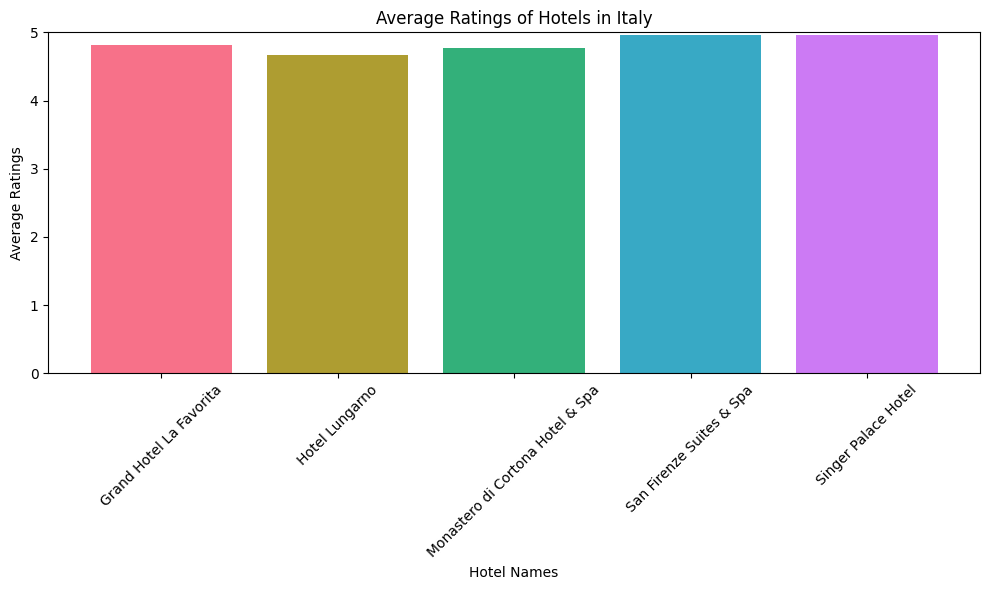

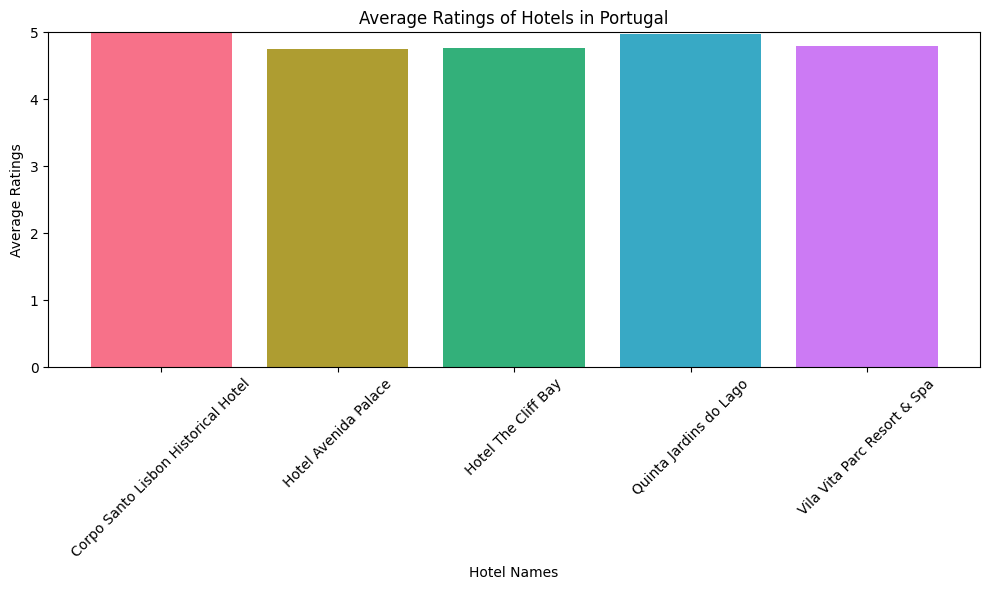

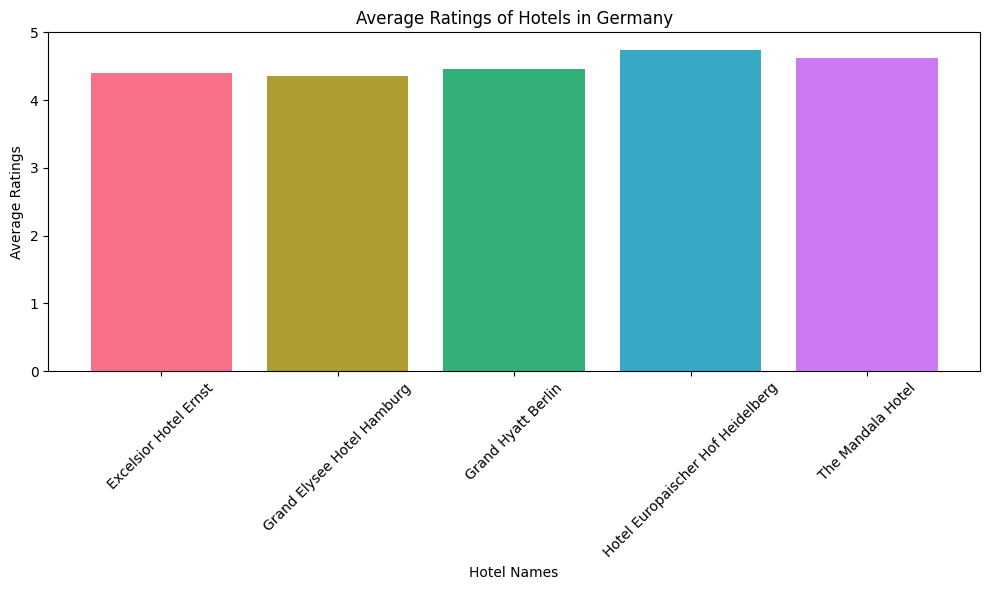

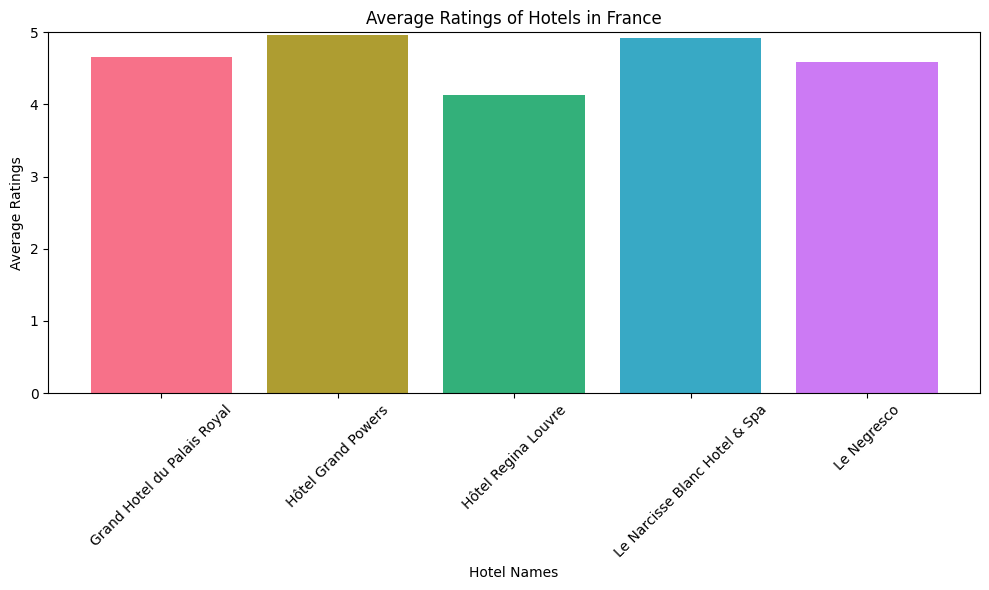

...

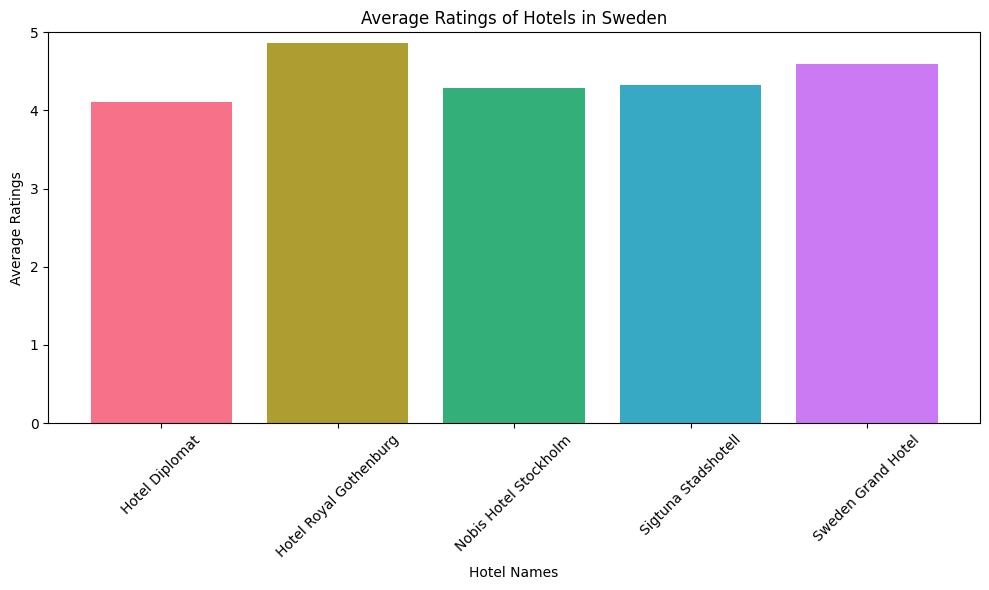

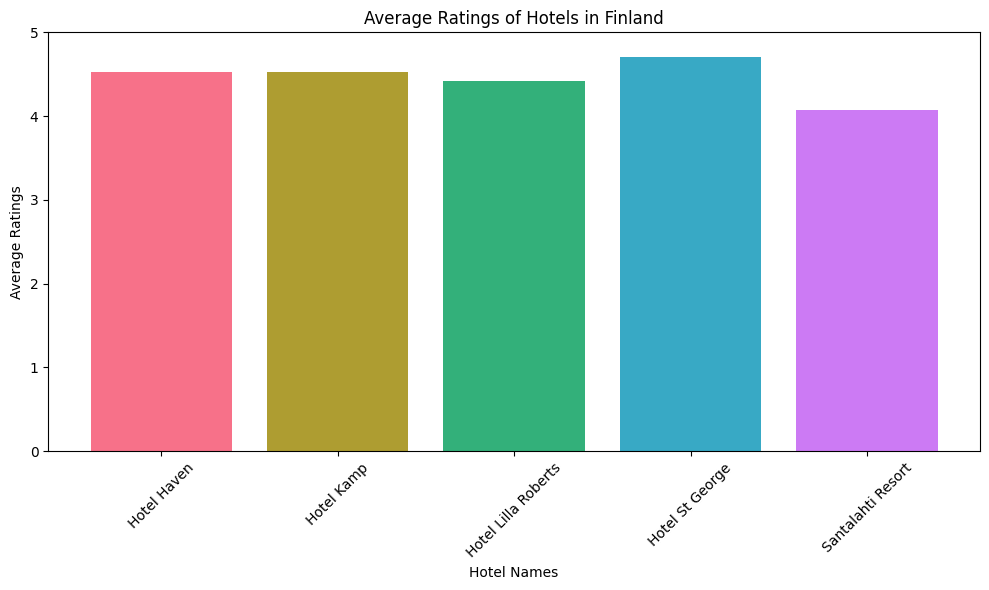

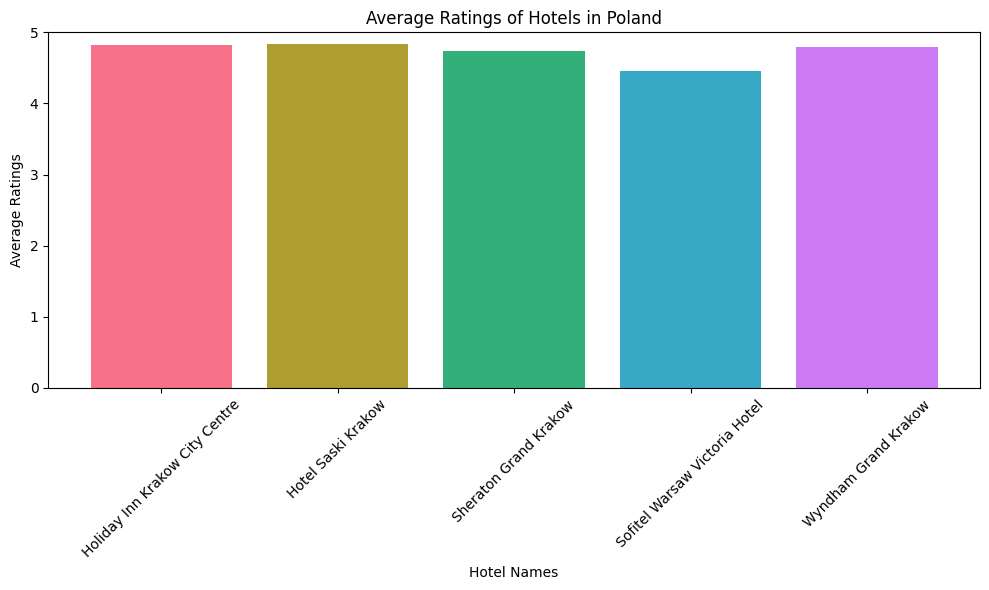

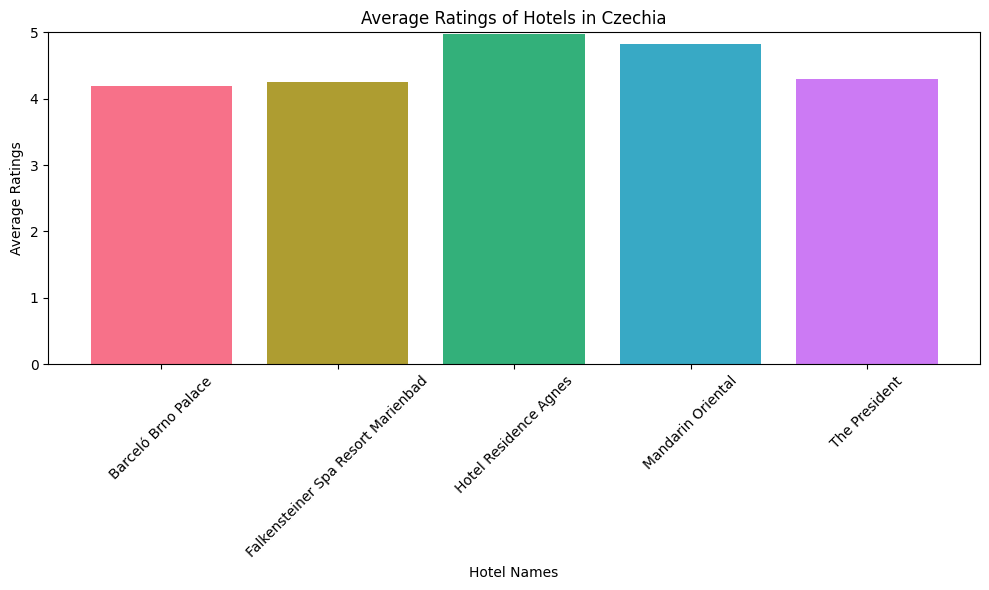

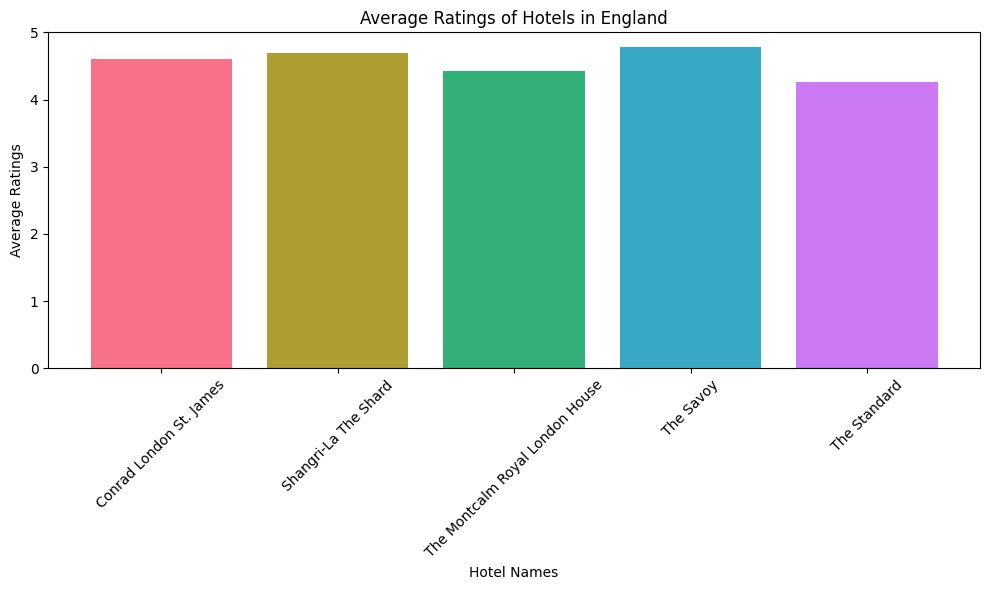

In [22]:
# Calculate average ratings for each hotel in each country
avg_ratings = df.groupby(['Country_name', 'Hotel_name'])['Rating'].mean().reset_index()

# Plotting average ratings for each country's hotels with different colors
countries = df['Country_name'].unique()

for country in countries:
    country_data = avg_ratings[avg_ratings['Country_name'] == country]
    hotels = country_data['Hotel_name']
    ratings = country_data['Rating']
    
    # Define a color palette for the hotels
    num_hotels = len(hotels)
    colors = sns.color_palette('husl', n_colors=num_hotels)
    
    plt.figure(figsize=(10, 6))
    plt.bar(hotels, ratings, color=colors)
    plt.title(f'Average Ratings of Hotels in {country}')
    plt.xlabel('Hotel Names')
    plt.ylabel('Average Ratings')
    plt.xticks(rotation=45)
    plt.ylim(0, 5)  # Assuming ratings range from 0 to 5
    plt.tight_layout()
    plt.show()

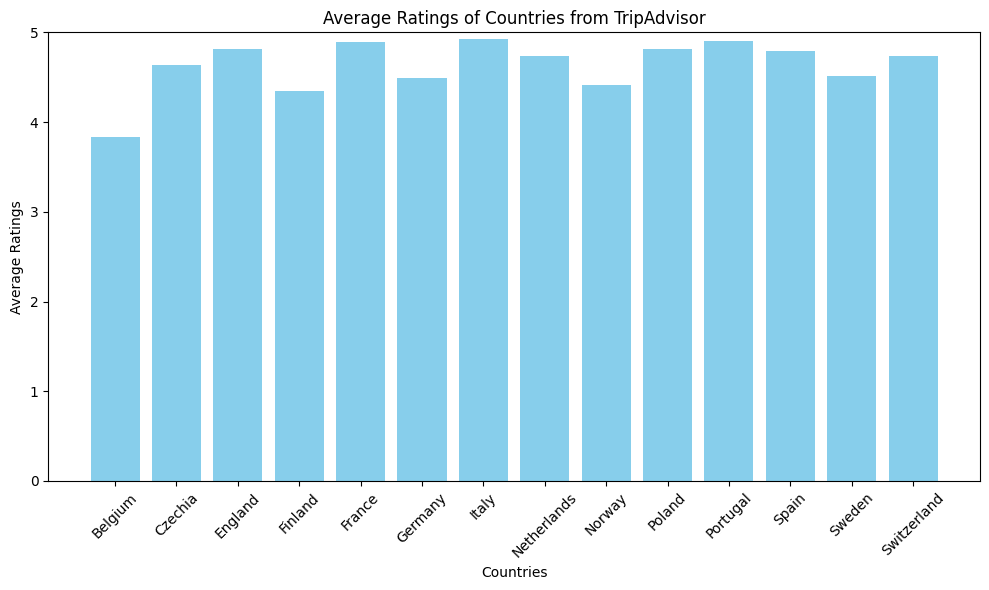

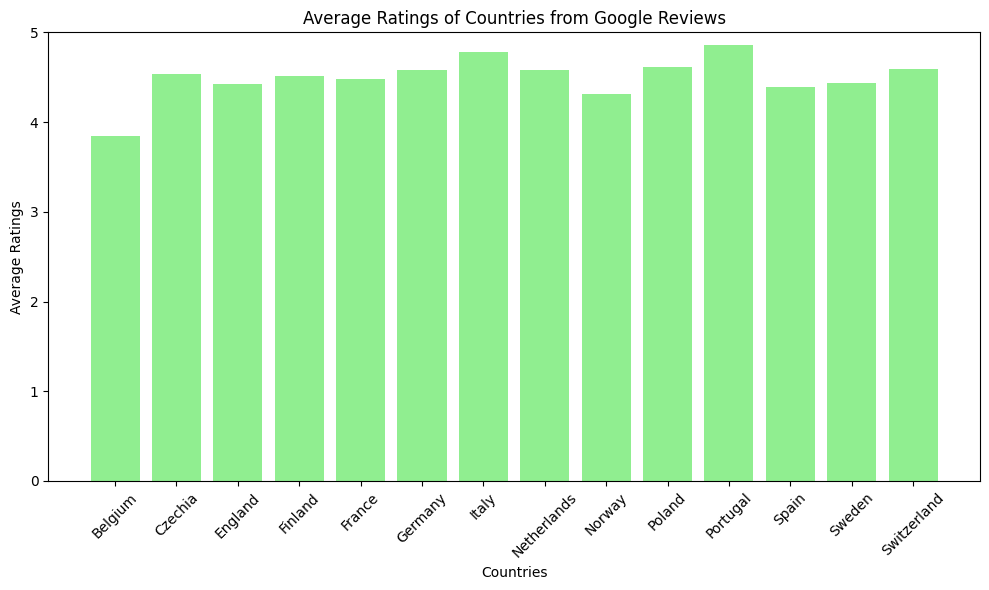

In [23]:
# Filter data for TripAdvisor and Google Reviews separately
tripadvisor_data = df[df['Site_Name'] == 'Tripadvisor']
google_data = df[df['Site_Name'] == 'Google Reviews']

# Calculate average ratings for each country from TripAdvisor
avg_ratings_tripadvisor = tripadvisor_data.groupby('Country_name')['Rating'].mean().reset_index()

# Calculate average ratings for each country from Google Reviews
avg_ratings_google = google_data.groupby('Country_name')['Rating'].mean().reset_index()

# Plotting average ratings for each country from TripAdvisor
plt.figure(figsize=(10, 6))
plt.bar(avg_ratings_tripadvisor['Country_name'], avg_ratings_tripadvisor['Rating'], color='skyblue')
plt.title('Average Ratings of Countries from TripAdvisor')
plt.xlabel('Countries')
plt.ylabel('Average Ratings')
plt.xticks(rotation=45)
plt.ylim(0, 5)  # Assuming ratings range from 0 to 5
plt.tight_layout()
plt.show()

# Plotting average ratings for each country from Google Reviews
plt.figure(figsize=(10, 6))
plt.bar(avg_ratings_google['Country_name'], avg_ratings_google['Rating'], color='lightgreen')
plt.title('Average Ratings of Countries from Google Reviews')
plt.xlabel('Countries')
plt.ylabel('Average Ratings')
plt.xticks(rotation=45)
plt.ylim(0, 5)  # Assuming ratings range from 0 to 5
plt.tight_layout()
plt.show()

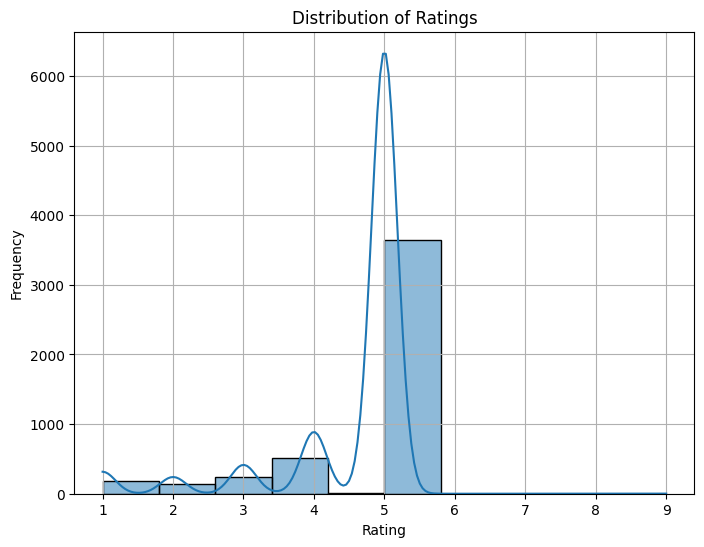

C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\2062732509.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_ratings_country, x='Country_name', y='Rating', palette='viridis')


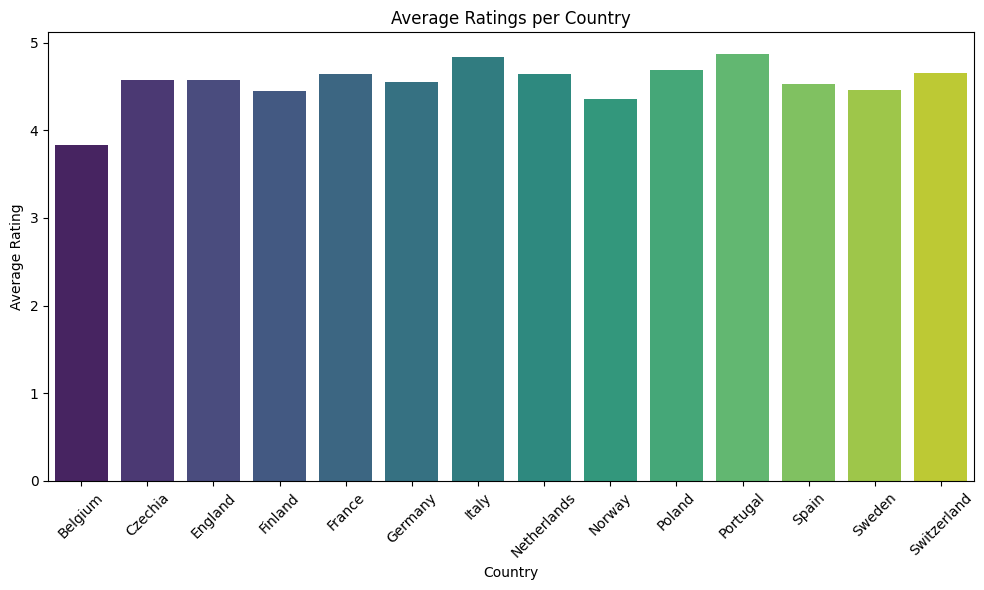

C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\2062732509.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Sentiment', palette='pastel')


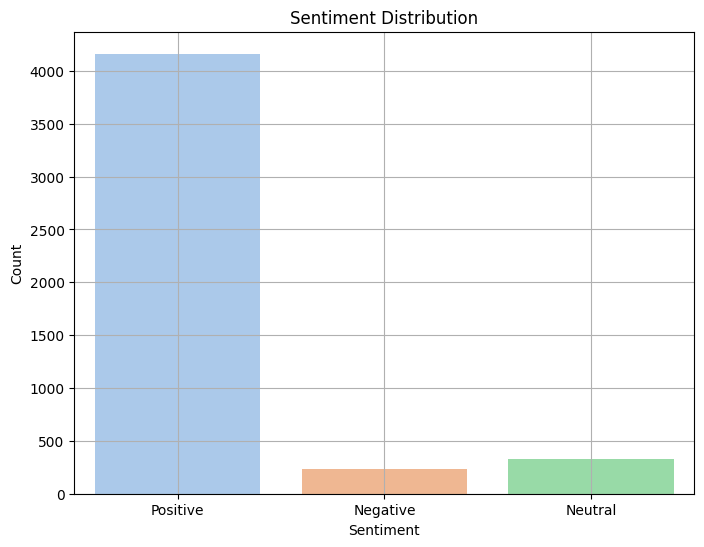

In [25]:
import seaborn as sns

# Summary Statistics
summary_stats = df.describe(include='all')

# Visualizations
# Distribution of Ratings
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='Rating', bins=10, kde=True)
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Average Ratings per Country
avg_ratings_country = df.groupby('Country_name')['Rating'].mean().reset_index()
plt.figure(figsize=(10, 6))
sns.barplot(data=avg_ratings_country, x='Country_name', y='Rating', palette='viridis')
plt.title('Average Ratings per Country')
plt.xlabel('Country')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Sentiment Distribution
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Sentiment', palette='pastel')
plt.title('Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.grid(True)
plt.show()


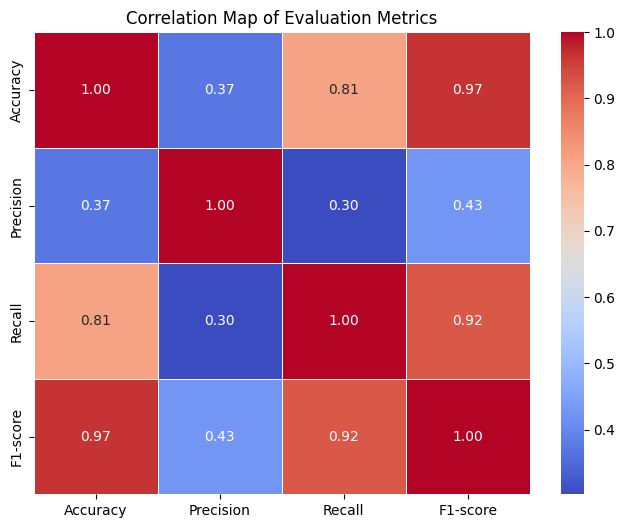

In [26]:
# Define the evaluation metrics
metrics = {
    'Accuracy': [0.90, 0.91, 0.91, 0.90, 0.08, 0.88],
    'Precision': [0.90, 0.74, 0.00, 0.00, 0.08, 0.92],
    'Recall': [0.52, 0.69, 0.61, 0.50, 0.33, 0.51],
    'F1-score': [0.54, 0.69, 0.58, 0.52, 0.05, 0.55]
}

# Create a DataFrame from the metrics dictionary
df_metrics = pd.DataFrame(metrics)

# Calculate the correlation matrix
corr_matrix = df_metrics.corr()

# Plotting the correlation map (heatmap)
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Map of Evaluation Metrics')
plt.show()

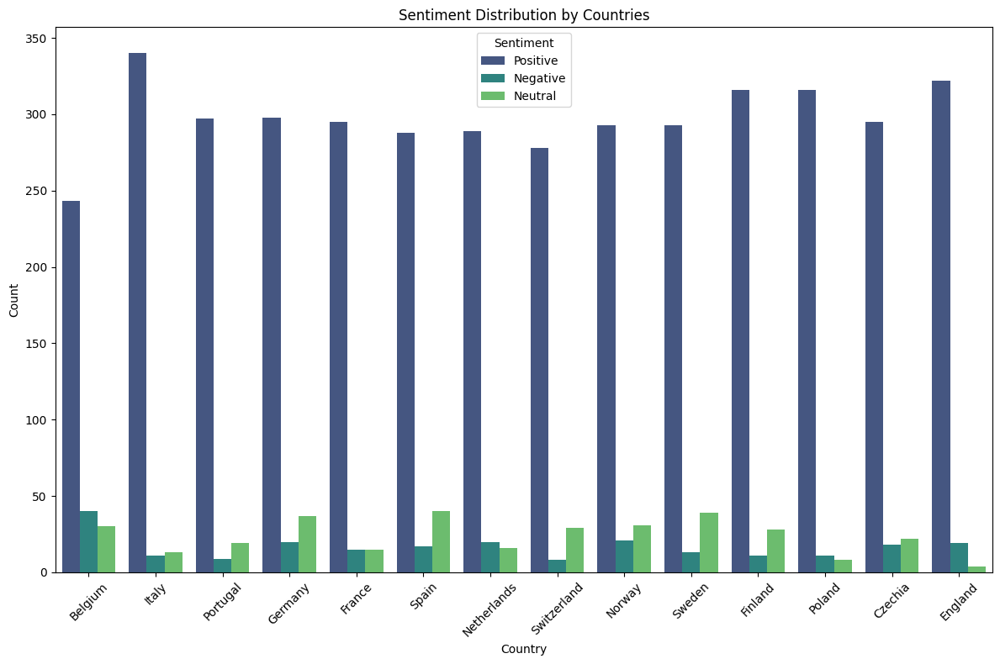

In [27]:
# Create a countplot for sentiment distribution by countries
plt.figure(figsize=(12, 8))
sns.countplot(data=df, x='Country_name', hue='Sentiment', palette='viridis')
plt.title('Sentiment Distribution by Countries')
plt.xlabel('Country')
plt.ylabel('Count')
plt.legend(title='Sentiment')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [28]:
# Count the occurrences of each sentiment
sentiment_counts = df['Sentiment'].value_counts()

# Display the counts
print(sentiment_counts)

Sentiment
Positive    4163
Neutral      331
Negative     233
Name: count, dtype: int64


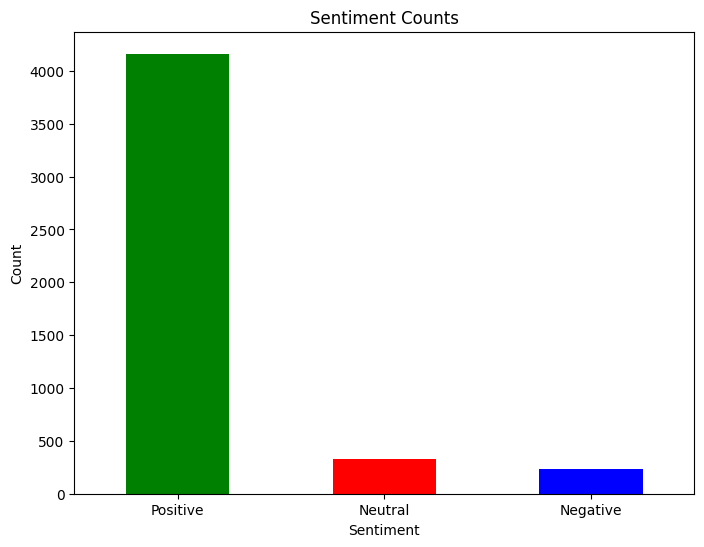

In [29]:
# Calculate sentiment counts
sentiment_counts = df['Sentiment'].value_counts()

# Create a bar plot for sentiment counts
plt.figure(figsize=(8, 6))
sentiment_counts.plot(kind='bar', color=['green', 'red', 'blue'])
plt.title('Sentiment Counts')
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels if necessary
plt.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\3133086534.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Text_Length'] = df['Review'].apply(len)


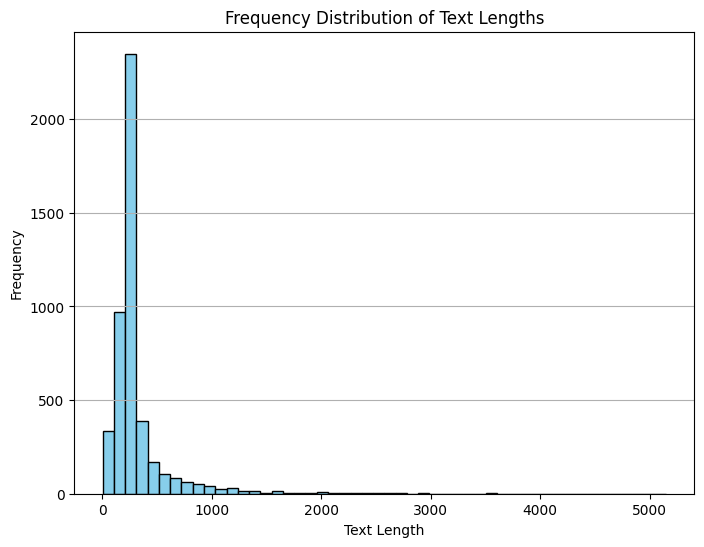

In [30]:
# Calculate text lengths and create a new column 'Text_Length'
df['Text_Length'] = df['Review'].apply(len)

# Plotting the frequency distribution of text lengths
plt.figure(figsize=(8, 6))
plt.hist(df['Text_Length'], bins=50, color='skyblue', edgecolor='black')
plt.title('Frequency Distribution of Text Lengths')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.grid(axis='y')
plt.show()

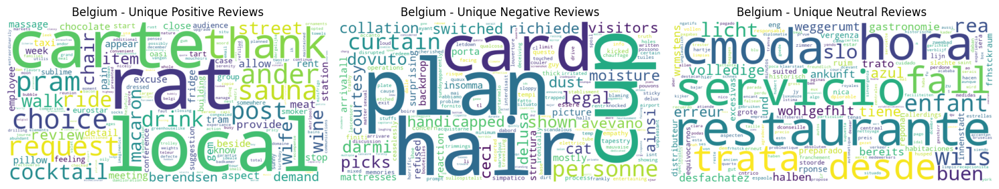

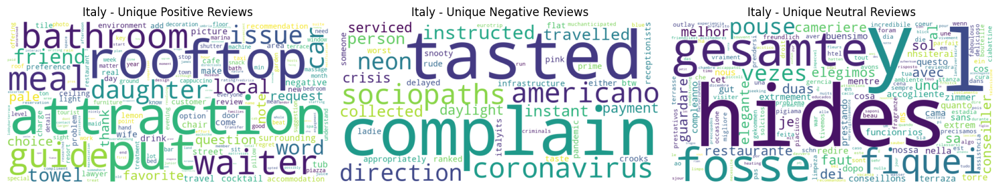

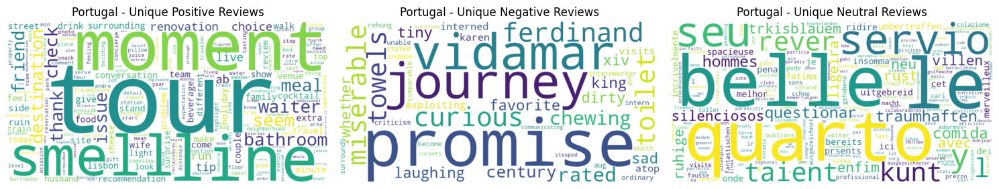

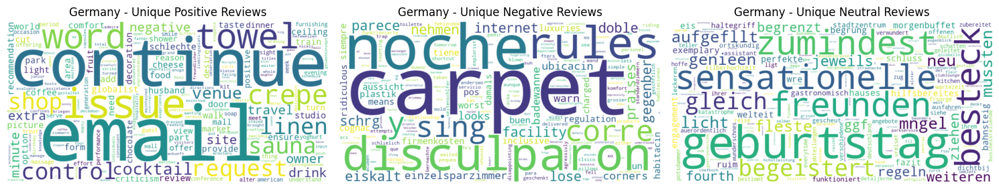

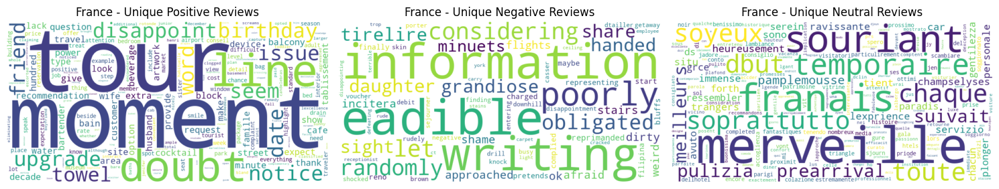

...

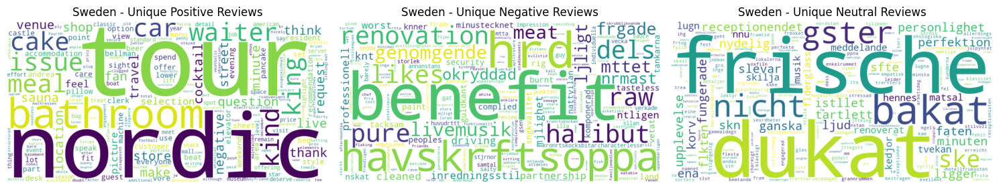

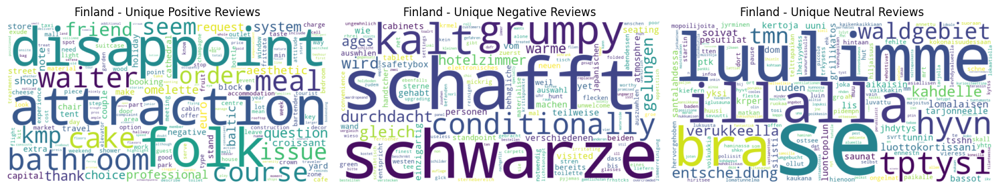

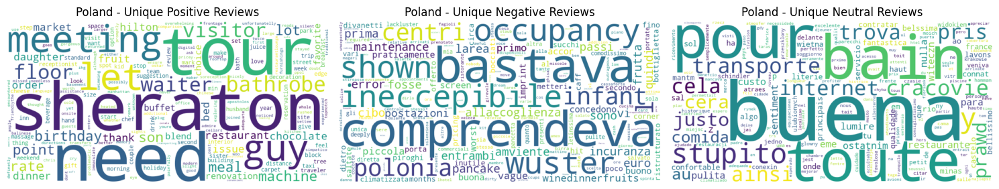

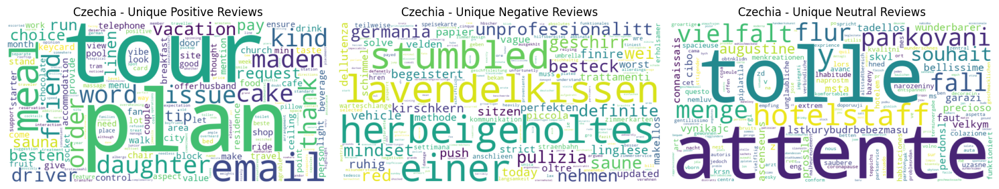

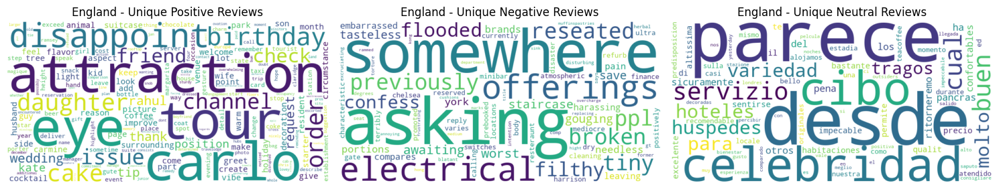

In [33]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate unique word clouds for each sentiment and country
def generate_unique_wordclouds(country):
    # Filter dataset for the specified country
    country_reviews = df[df['Country_name'] == country]

    # Separate reviews by sentiment
    positive_reviews = country_reviews[country_reviews['Sentiment'] == 'Positive']['Review_No_Special_Chars']
    negative_reviews = country_reviews[country_reviews['Sentiment'] == 'Negative']['Review_No_Special_Chars']
    neutral_reviews = country_reviews[country_reviews['Sentiment'] == 'Neutral']['Review_No_Special_Chars']

    # Tokenize words for each sentiment
    positive_words = ' '.join(positive_reviews).split()
    negative_words = ' '.join(negative_reviews).split()
    neutral_words = ' '.join(neutral_reviews).split()

    # Find unique words for each sentiment category
    unique_positive_words = set(positive_words) - set(negative_words) - set(neutral_words)
    unique_negative_words = set(negative_words) - set(positive_words) - set(neutral_words)
    unique_neutral_words = set(neutral_words) - set(positive_words) - set(negative_words)

    # Convert unique words to text for word clouds
    unique_positive_text = ' '.join(unique_positive_words)
    unique_negative_text = ' '.join(unique_negative_words)
    unique_neutral_text = ' '.join(unique_neutral_words)

    # Generate word clouds for unique words
    wordcloud_positive = WordCloud(width=800, height=400, background_color='white').generate(unique_positive_text)
    wordcloud_negative = WordCloud(width=800, height=400, background_color='white').generate(unique_negative_text)
    wordcloud_neutral = WordCloud(width=800, height=400, background_color='white').generate(unique_neutral_text)

    # Plot word clouds for each sentiment category with unique words
    plt.figure(figsize=(15, 5))

    plt.subplot(131)  # 1 row, 3 columns, plot 1
    plt.imshow(wordcloud_positive, interpolation='bilinear')
    plt.title(f'{country} - Unique Positive Reviews')
    plt.axis('off')

    plt.subplot(132)  # 1 row, 3 columns, plot 2
    plt.imshow(wordcloud_negative, interpolation='bilinear')
    plt.title(f'{country} - Unique Negative Reviews')
    plt.axis('off')

    plt.subplot(133)  # 1 row, 3 columns, plot 3
    plt.imshow(wordcloud_neutral, interpolation='bilinear')
    plt.title(f'{country} - Unique Neutral Reviews')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# List of unique countries in your dataset
unique_countries = df['Country_name'].unique()

# Generate unique word clouds for each country
for country in unique_countries:
    generate_unique_wordclouds(country)

C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\365223095.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Rating', palette='Set2')


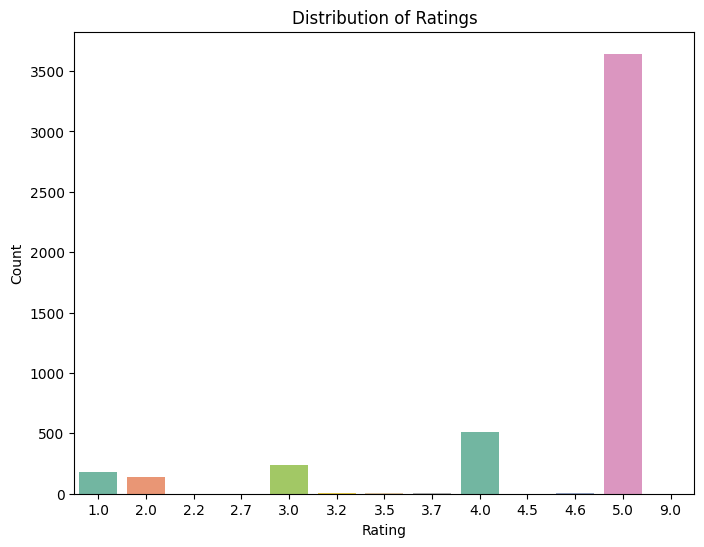

In [34]:
# Plotting rating distribution
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Rating', palette='Set2')
plt.title('Distribution of Ratings')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

                              Hotel_name  Average_Rating  Review_Count
5    Corpo Santo Lisbon Historical Hotel        5.000000            95
47                Quinta Jardins do Lago        4.981818            55
24                 Hotel Residence Agnes        4.980952           105
45  Pillows Grand Boutique Hotel Maurits        4.969231            65
55                   Singer Palace Hotel        4.964706            85
32                    Hôtel Grand Powers        4.963636            55
49              San Firenze Suites & Spa        4.963636            55
60                             THE OMNIA        4.945455            55
35         Le Narcisse Blanc Hotel & Spa        4.927273            55
25                Hotel Royal Gothenburg        4.861538            65


C:\Users\DELL\AppData\Local\Temp\ipykernel_1608\3048262764.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_10_hotels, x='Average_Rating', y='Hotel_name', palette='viridis')


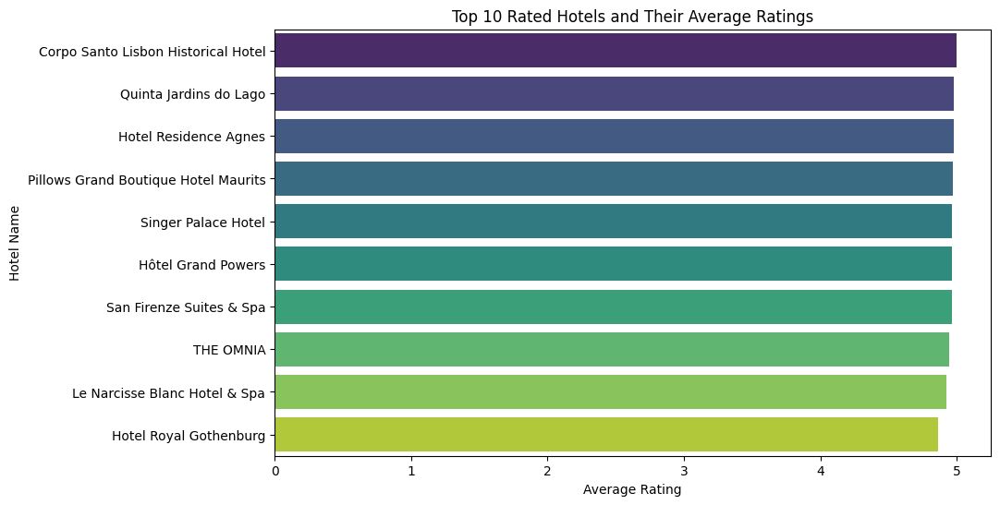

In [35]:
# Group by hotel name, calculate average rating and count of reviews
hotel_ratings = df.groupby('Hotel_name').agg({'Rating': 'mean', 'Review': 'count'}).reset_index()

# Rename columns for clarity
hotel_ratings.columns = ['Hotel_name', 'Average_Rating', 'Review_Count']

# Find the top 10 rated hotels
top_10_hotels = hotel_ratings.nlargest(10, 'Average_Rating')

# Display top 10 rated hotels with their average rating and review count
print(top_10_hotels)

# Visualize top 10 rated hotels and their average ratings
plt.figure(figsize=(10, 6))
sns.barplot(data=top_10_hotels, x='Average_Rating', y='Hotel_name', palette='viridis')
plt.title('Top 10 Rated Hotels and Their Average Ratings')
plt.xlabel('Average Rating')
plt.ylabel('Hotel Name')
plt.show()

In [36]:
from geopy.geocoders import Nominatim
import pandas as pd


data = {
    'Country_name': [
    'Belgium', 'Italy', 'Portugal', 'Germany', 'France', 'Spain', 'Netharlands',
    'Switzerland', 'Norway', 'Sweden', 'Finland', 'Poland', 'Czechia', 'England'
]
   
}

df_countries = pd.DataFrame(data)

# Initialize geolocator
geolocator = Nominatim(user_agent="country_locator")

# Define a function to get location coordinates (latitude and longitude) based on country name
def get_coordinates(country):
    location = geolocator.geocode(country)
    if location:
        return location.latitude, location.longitude
    else:
        return None

# Apply the function to your dataset's country names
df_countries['Coordinates'] = df_countries['Country_name'].apply(get_coordinates)

print(df_countries)

   Country_name                             Coordinates
0       Belgium                 (50.6402809, 4.6667145)
1         Italy                 (42.6384261, 12.674297)
2      Portugal                (39.6621648, -8.1353519)
3       Germany               (40.4203479, -79.1166983)
4        France                  (46.603354, 1.8883335)
5         Spain                (39.3260685, -4.8379791)
6   Netharlands  (9.805253650000001, 80.22343191044078)
7   Switzerland                 (46.7985624, 8.2319736)
8        Norway         (64.5731537, 11.52803643954819)
9        Sweden                 (44.133435, -70.822678)
10      Finland                (63.2467777, 25.9209164)
11       Poland                  (52.215933, 19.134422)
12      Czechia                (49.7439047, 15.3381061)
13      England                (52.5310214, -1.2649062)


In [37]:
import folium

# Create a map centered at the world map's approximate center
m = folium.Map(location=[0, 0], zoom_start=2)

# List of country names and their approximate latitude and longitude coordinates
data = {
    'Country_name': [
        'Belgium', 'Italy', 'Portugal', 'Germany', 'France', 'Spain', 
        'Netherlands', 'Switzerland', 'Norway', 'Sweden', 'Finland', 
        'Poland', 'Czechia', 'England'
    ],
    'Coordinates': [
        (50.5039, 4.4699), (41.8719, 12.5674), (39.3999, -8.2245),
        (51.1657, 10.4515), (46.6034, 1.8883), (40.4637, -3.7492),
        (52.1326, 5.2913), (46.8182, 8.2275), (60.472, 8.4689), 
        (60.1282, 18.6435), (61.9241, 25.7482), (51.9194, 19.1451), 
        (49.8175, 15.47296), (52.3555, -1.1743)
    ]
}

df_countries = pd.DataFrame(data)

# Add markers for each country
for index, row in df_countries.iterrows():
    folium.Marker(location=row['Coordinates'], popup=row['Country_name']).add_to(m)

# Display the map
m.save('world_map_all14_countries.html')  # Save the map as an HTML file

In [38]:
m

In [40]:
from geopy.geocoders import Nominatim

# Define hotels for each country
hotels = {
    'Belgium': [
        'Botanic Sanctuary Antwerp',
        'Eurostars Montgomery',
        'Radisson Collection Grand Place Brussels',
        "Martin's Chateau Du Lac Hotel",
        'La Butte aux Bois'
    ],
    'Italy': [
        'Grand Hotel La Favorita',
        'Hotel Lungarno',
        'San Firenze Suites & Spa',
        'Singer Palace Hotel',
        'Monastero di Cortona Hotel & Spa'
    ],
    'Portugal': [
        'Corpo Santo Lisbon Historical Hotel',
        'Hotel Avenida Palace',
        'Hotel The Cliff Bay',
        'Quinta Jardins do Lago',
        'Vila Vita Parc Resort & Spa'
    ],
    'Germany': [
        'Hotel Europaischer Hof Heidelberg',
        'Excelsior Hotel Ernst',
        'Grand Elysee Hotel Hamburg',
        'Grand Hyatt Berlin',
        'The Mandala Hotel'
    ],
    'France': [
        'Grand Hotel du Palais Royal',
        'Hôtel Grand Powers',
        'Hôtel Regina Louvre',
        'Le Narcisse Blanc Hotel & Spa',
        'Le Negresco'
    ],
    'Spain': [
        'Majestic Hotel & Spa Barcelona',
        'Palacio de los Duques Gran Meliá',
        'Paradisus by Meliá Gran Canaria',
        'Serras Barcelona',
        'The Principal Madrid'
    ],
    'Netherlands': [
        'Collection Eindhoven Centre',
        'Hotel Okura Amsterdam',
        'Pillows Grand Boutique Hotel Maurits',
        'Pulitzer Amsterdam',
        'Sofitel Legend The Grand Amsterdam'
    ],
    'Switzerland': [
        'Hotel Schweizerhof Luzern',
        'Hotel Royal Savoy Lausanne',
        'Hotel Splendide Royal',
        'Storchen Zurich - Lifestyle Boutique Hotel',
        'THE OMNIA'
    ],
    'Norway': [
        'Hotel Continental Oslo',
        'Britannia Hotel',
        'Grand Hotel Oslo by Scandic',
        'Lysebu',
        'The Thief'
    ],
    'Sweden': [
        'Sweden Grand Hotel',
        'Hotel Diplomat',
        'Hotel Royal Gothenburg',
        'Nobis Hotel Stockholm',
        'Sigtuna Stadshotell'
    ],
    'Finland': [
        'Hotel Kamp',
        'Hotel Haven',
        'Hotel Lilla Roberts',
        'Hotel St George',
        'Santalahti Resort'
    ],
    'Poland': [
        'Sofitel Warsaw Victoria Hotel',
        'Holiday Inn Krakow City Centre',
        'Hotel Saski Krakow',
        'Sheraton Grand Krakow',
        'Wyndham Grand Krakow'
    ],
    'Czechia': [
        'Hotel Residence Agnes',
        'Barceló Brno Palace',
        'Falkensteiner Spa Resort Marienbad',
        'Mandarin Oriental',
        'The President'
    ],
    'England': [
        'Conrad London St. James',
        'Shangri-La The Shard',
        'The Montcalm Royal London House',
        'The Savoy',
        'The Standard'
    ]
}

# Initialize geolocator
geolocator = Nominatim(user_agent="hotel_locator")

# Function to get coordinates
def get_coordinates(country, hotel):
    query = f"{hotel}, {country}"
    location = geolocator.geocode(query)
    return (location.latitude, location.longitude) if location else None

# Loop through countries and hotels to get coordinates
coordinates = {}
for country, country_hotels in hotels.items():
    country_coords = {}
    for hotel in country_hotels:
        coords = get_coordinates(country, hotel)
        country_coords[hotel] = coords
    coordinates[country] = country_coords

# Print coordinates
for country, country_hotels in coordinates.items():
    print(f"Country: {country}")
    for hotel, coords in country_hotels.items():
        print(f"{hotel}: {coords}")

Country: Belgium
Botanic Sanctuary Antwerp: (51.2136338, 4.4057049)
Eurostars Montgomery: (50.8382052, 4.4069633)
Radisson Collection Grand Place Brussels: (50.8495927, 4.3564529)
Martin's Chateau Du Lac Hotel: (50.7288574, 4.5137893)
La Butte aux Bois: None
Country: Italy
Grand Hotel La Favorita: (40.6270107, 14.3718432)
Hotel Lungarno: (43.7679262, 11.2515789)
San Firenze Suites & Spa: None
Singer Palace Hotel: None
Monastero di Cortona Hotel & Spa: None
Country: Portugal
Corpo Santo Lisbon Historical Hotel: (38.70738235, -9.141340563886644)
Hotel Avenida Palace: (38.7147629, -9.141359903267427)
Hotel The Cliff Bay: (32.63926935, -16.926105904733056)
Quinta Jardins do Lago: (32.655965, -16.918463355668603)
Vila Vita Parc Resort & Spa: (37.1015409, -8.379386807195795)
Country: Germany
Hotel Europaischer Hof Heidelberg: (49.4080367, 8.6954063)
Excelsior Hotel Ernst: (50.94217055, 6.956348322668921)
Grand Elysee Hotel Hamburg: (53.563390999999996, 9.990609501570518)
Grand Hyatt Berlin: 

In [41]:
import folium

# Initialize map centered at an approximate location
m = folium.Map(location=[48, 8], zoom_start=3)  # You can adjust the coordinates and zoom level

# List of country names and their hotel names with coordinates
data = {
    'Country_name': [
        'Belgium', 'Italy', 'Portugal', 'Germany', 'France', 'Spain', 
        'Netherlands', 'Switzerland', 'Norway', 'Sweden', 'Finland', 
        'Poland', 'Czechia', 'England'
    ],
    'Hotel_names': [
        ['Botanic Sanctuary Antwerp', 'Eurostars Montgomery', 'Radisson Collection Grand Place Brussels', 'Martin\'s Chateau Du Lac Hotel', 'La Butte aux Bois'],
        ['Grand Hotel La Favorita', 'Hotel Lungarno', 'San Firenze Suites & Spa', 'Singer Palace Hotel', 'Monastero di Cortona Hotel & Spa'],
        ['Corpo Santo Lisbon Historical Hotel', 'Hotel Avenida Palace', 'Hotel The Cliff Bay', 'Quinta Jardins do Lago', 'Vila Vita Parc Resort & Spa'],
        ['Hotel Europaischer Hof Heidelberg', 'Excelsior Hotel Ernst', 'Grand Elysee Hotel Hamburg', 'Grand Hyatt Berlin', 'The Mandala Hotel'],
        ['Grand Hotel du Palais Royal', 'Hôtel Grand Powers', 'Hôtel Regina Louvre', 'Le Narcisse Blanc Hotel & Spa', 'Le Negresco'],
        ['Majestic Hotel & Spa Barcelona', 'Palacio de los Duques Gran Meliá', 'Paradisus by Meliá Gran Canaria', 'Serras Barcelona', 'The Principal Madrid'],
        ['Collection Eindhoven Centre', 'Hotel Okura Amsterdam', 'Pillows Grand Boutique Hotel Maurits', 'Pulitzer Amsterdam', 'Sofitel Legend The Grand Amsterdam'],
        ['Hotel Schweizerhof Luzern', 'Hotel Royal Savoy Lausanne', 'Hotel Splendide Royal', 'Storchen Zurich - Lifestyle Boutique Hotel', 'THE OMNIA'],
        ['Hotel Continental Oslo', 'Britannia Hotel', 'Grand Hotel Oslo by Scandic', 'Lysebu', 'The Thief'],
        ['Sweden Grand Hotel', 'Hotel Diplomat', 'Hotel Royal Gothenburg', 'Nobis Hotel Stockholm', 'Sigtuna Stadshotell'],
        ['Hotel Kamp', 'Hotel Haven', 'Hotel Lilla Roberts', 'Hotel St George', 'Santalahti Resort'],
        ['Sofitel Warsaw Victoria Hotel', 'Holiday Inn Krakow City Centre', 'Hotel Saski Krakow', 'Sheraton Grand Krakow', 'Wyndham Grand Krakow'],
        ['Hotel Residence Agnes', 'Barceló Brno Palace', 'Falkensteiner Spa Resort Marienbad', 'Mandarin Oriental', 'The President'],
        ['Conrad London St. James', 'Shangri-La The Shard', 'The Montcalm Royal London House', 'The Savoy', 'The Standard']
    ],
    'Coordinates': [
        [(50.6402809, 4.6667145), (50.8382052, 4.4069633), (50.8495927, 4.3564529), (50.7288574, 4.5137893), (50.915144384679685, 5.668149341279587)],
        [(40.6270107, 14.3718432), (43.7679262, 11.2515789), (43.76997120671854, 11.257349185282882), (41.899309736873384, 12.481140451440883), (43.27651026116412, 11.987074096662043)],
        [(38.70738235, -9.141340563886644), (38.7147629, -9.141359903267427), (32.63926935, -16.926105904733056), (32.655965, -16.918463355668603), (37.1015409, -8.379386807195795)],
        [(49.4080367, 8.6954063), (50.94217055, 6.956348322668921), (53.563390999999996, 9.990609501570518), (52.5081971, 13.3724841), (52.5089383, 13.3738661)],
        [(48.867206350000004, 2.337448212519458), (48.86930791555213, 2.3031577969779473), (48.8637204, 2.3325149), (48.86083431490031, 2.310455040737544), (45.1877761, 5.7277518)],
        [(41.3936815, 2.164139932022144), (40.4196522, -3.710065157740586), (27.77082084794505, -15.54267574452068), (41.3802369, 2.1806674146535068), (40.4193652, -3.6971316)],
        [(51.44067334781833, 5.48032135295397), (52.3486193, 4.8931991), (52.3621736, 4.9197018), (52.3728089, 4.8834291), (52.371094682741195, 4.895535724618074)],
        [(47.0543195, 8.3102224), (46.51102195, 6.628358782946929), (45.995004449999996, 8.945925847892457), (47.3713972278251, 8.541741810915914), (46.0205215, 7.7453631)],
        [(59.91409, 10.733521), (63.4317139, 10.3987305), (59.91377104642576, 10.739452516848457), (59.9776685, 10.656168481012724), (59.907613, 10.72098)],
        [(59.51612804007104, 18.126354480291337), (59.3319154, 18.0806988), (57.7063606, 11.9722323), (59.3334572, 18.0738859), (59.614739799999995, 17.719641516245908)],
        [(60.1682072, 24.9472992), (60.1665076, 24.9515473), (60.165678799999995, 24.946995769676292), (60.1668539, 24.9406956), (60.43790301339216, 26.865127540331127)],
        [(52.23994320931455, 21.013270824612352), (50.05912356559433, 19.943781411025885), (50.0633379, 19.9374505), (50.05604395, 19.93079973798206), (50.0638819, 19.9404196)],
        [(50.09136, 14.4257915), (49.1921304, 16.6055663), (49.97112088179413, 12.701683955199352), (50.08472, 14.4054613), (50.0923407, 14.419632734819533)],
        [(51.4993247, -0.13238686610614292), (51.504463570748314, -0.08683814658386436), (51.5215949, -0.0857045), (53.771723800000004, -0.2900898918016613), (51.5294697, -0.1243303)]
    ]
}

# Adding hotel markers to the map
for i in range(len(data['Country_name'])):
    country = data['Country_name'][i]
    hotel_names = data['Hotel_names'][i]
    coordinates = data['Coordinates'][i]
    
    for j in range(len(hotel_names)):
        if coordinates[j] is not None:
            folium.Marker(location=coordinates[j], popup=f"{hotel_names[j]}, {country}").add_to(m)

In [42]:
m